# Compound Events
- https://github.com/e-baumer/standard_precip
Metrics
|suffix|description|note|
|--|--|--|
|day_total|Total Compound Days|a day that satisfies all conditions|
|event_total|Total Compound Event|a compound day that is part of a sequence of 1+ consecutive days|
|sequence_total|Total Compound Sequence|a sequence of consecutive compound events with size>1|
|duration_mean|Average Compound Sequence Duration|a sequence of consecutive compound events with size>1|
|duration_max|Max Compound Sequence Duration|a sequence of consecutive compound events with size>1|

# CHANGE TO ACCUMULATED RZSM

In [1]:
# !python rzsm.py -i '../CASI2_RZSM_RAW' -o '../compound'

In [1]:
%%time
import os
import pandas as pd
import warnings
from plot import Plot
from process import Compound
warnings.filterwarnings('ignore')

plotly = False
event = ['CWHE','CDHE', 'CFE'][2]
# months = [6, 7, 8]
months = None
center='LARC'

freq, scale, gamma_n = 'D', 30, [10, 20, 30][2]

metrics = {
    '_duration_mean$':  f'Average {event} Duration',
    '_sequence_total$': f'Total {event} Sequences',
    '_duration_max$':   f'Max {event} Duration',
    '_event_total$':    f'Total {event}',
    '_day_total$':      f'Total {event} Days'
}

def get_thresholds(event):
    ''' Set up thresholds for different severity levels of compound events.
        (dict of thresholds, whether to create all threshold combos)
    '''
    def f_to_c(f):
        return (f - 32) * 5/9
    if event == 'CDHE':
        return ({'spi': ['<', [-1, -2]], # standardized
                 'tasmax': ['>', [f_to_c(90)]], # tm (f->c)
                }, True)
    elif event == 'CWHE':
        return ({'spi': ['>', [-1, -2]], # standardized
                 'tasmax': ['>', [f_to_c(90)]], # tm (f->c)
                }, True)
    elif event == 'CFE':
        # return ({'rzsm': ['>', [.7, .8, .9, .95, .98]], # percentiles
        #          'pr': ['>', [40, 50, 60]], # mm/day
        #         }, True)
        return ({'rzsm': ['>', [.7, .8]], # percentiles
                 'pr': ['>', [40, 50]], # mm/day
                }, True)
    else:
        raise ValueError('Invalid event type')
        
thresholds = get_thresholds(event)

result, compound, groups = Compound(center, event, months, freq, scale, thresholds, gamma_n).main()

{'rzsm': ('>', 0.7), 'pr': ('>', 40)}
{'rzsm': ('>', 0.7), 'pr': ('>', 50)}
{'rzsm': ('>', 0.8), 'pr': ('>', 40)}
{'rzsm': ('>', 0.8), 'pr': ('>', 50)}
CPU times: user 12.5 s, sys: 352 ms, total: 12.8 s
Wall time: 12.8 s


In [ ]:
groups['pr']

## Analysis
## Trends

In [ ]:
# SPI
var = 'spi'
if var in groups:
    p = Plot(center, months, f'Average SPI', f'_{var}$')
    dd = groups[var]
    p.dist_sns(dd)
    p.ts_plotly(dd) if plotly else p.ts_sns(dd)

In [ ]:
# Max Temperature
var = 'tasmax'
if var in groups:
    p = Plot(center, months, f'Average Max Temperature', f'_{var}$')
    dd = groups[var]
    p.dist_sns(dd)
    p.ts_plotly(dd) if plotly else p.ts_sns(dd)

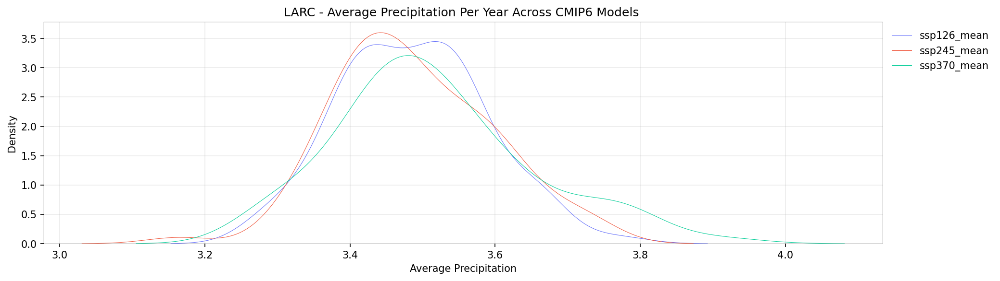

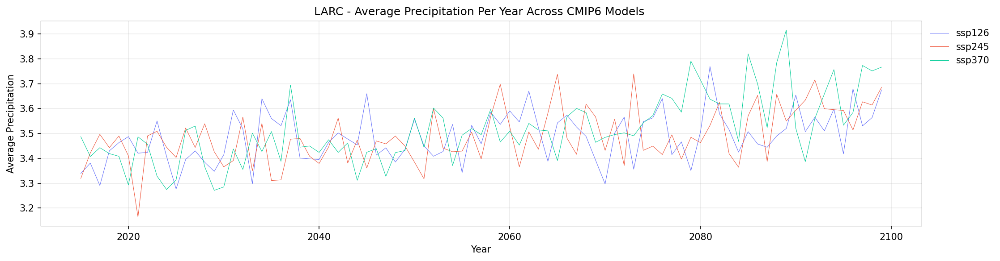

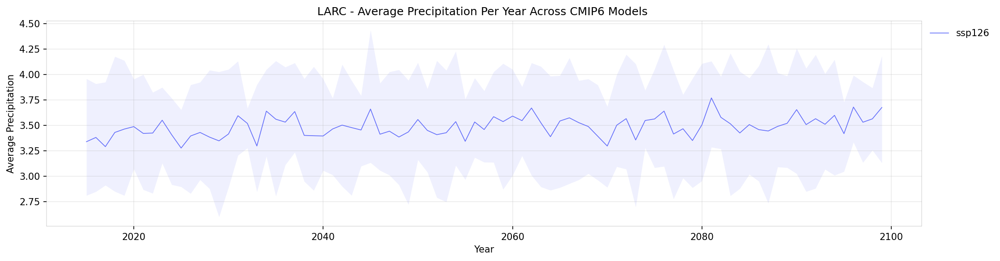

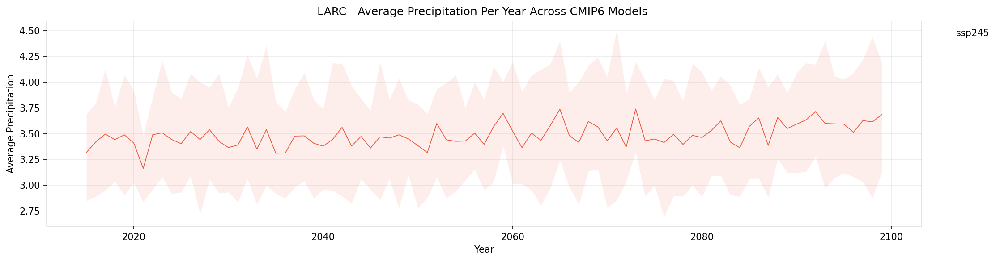

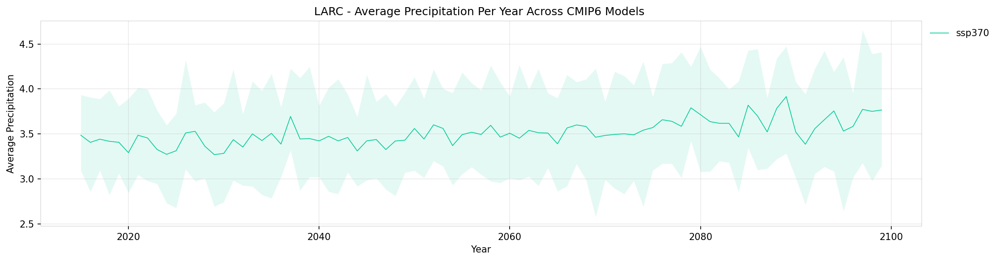

In [2]:
# Precipitation
var = 'pr'
if var in groups:
    p = Plot(center, months, f'Average Precipitation', f'_{var}$')
    dd = groups[var]
    p.dist_sns(dd)
    p.ts_plotly(dd) if plotly else p.ts_sns(dd)

## Compound

In [ ]:
# display(result['spi<-1_tasmax>32.2'].filter(regex='ACCESS-CM2'))

In [ ]:
# # Total Compound Days
# m = '_day_total$'
# Plot(center, months, metrics[m], m).all(result, plotly)

In [ ]:
# # Total Compound Events
# m = '_event_total$'
# Plot(center, months, metrics[m], m).all(result, plotly)

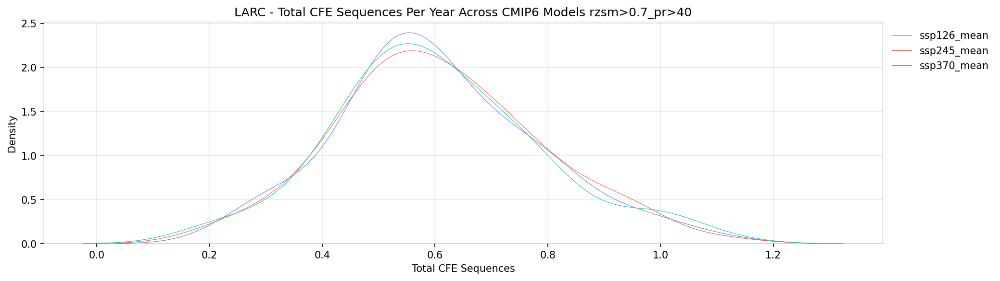

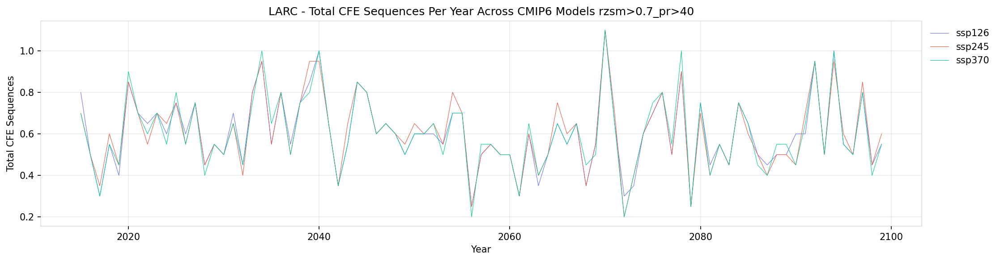

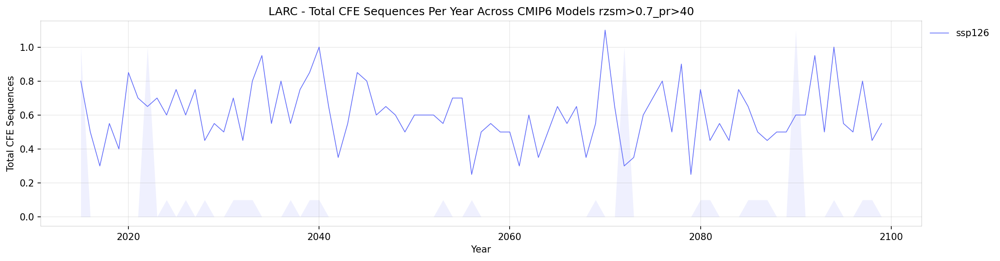

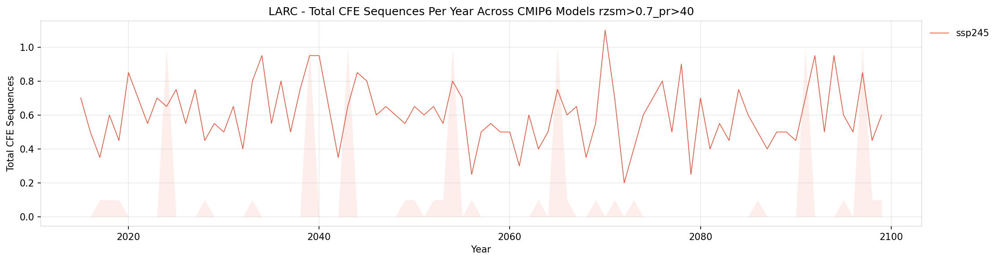

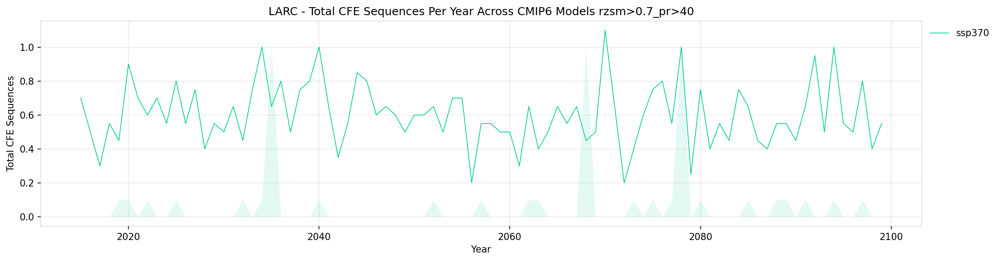

...

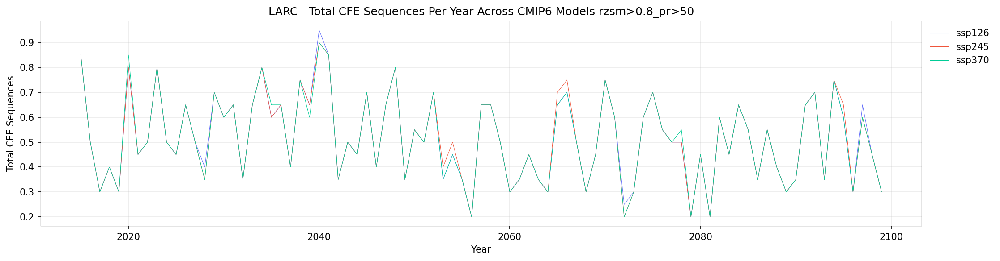

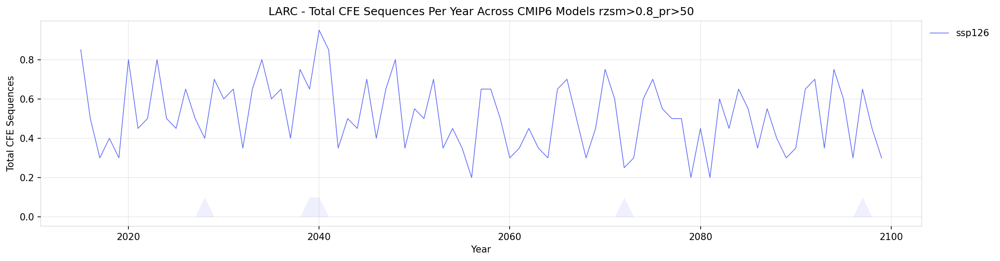

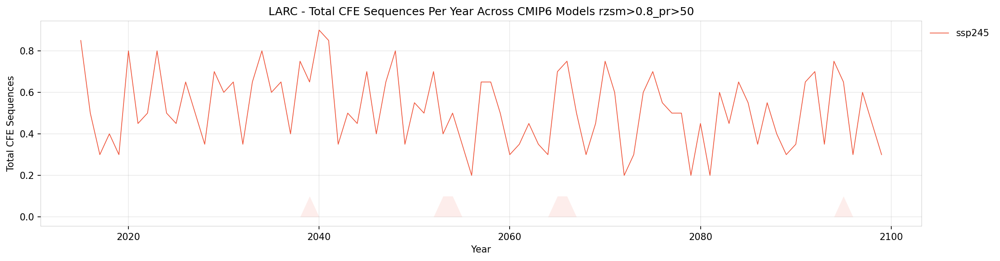

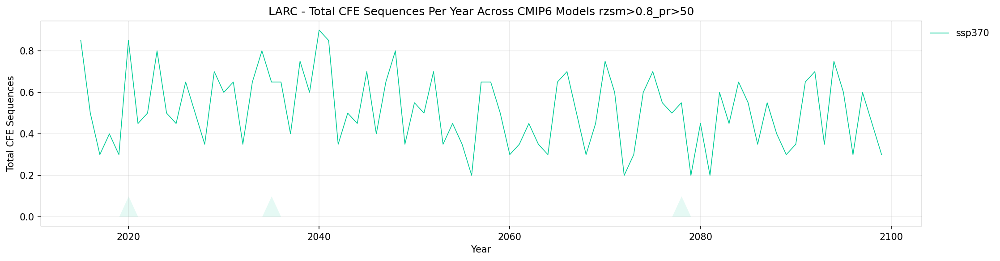

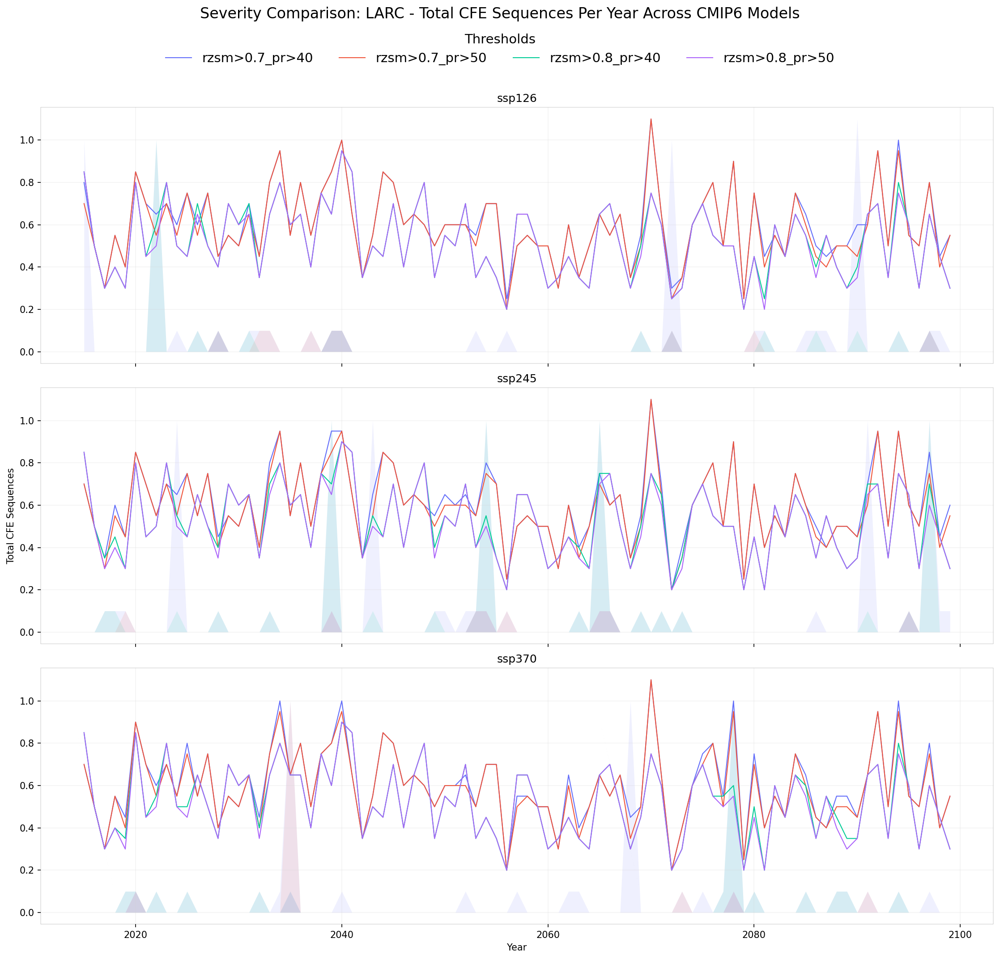

In [3]:
# Total Compound Event Sequences
m = '_sequence_total$'
Plot(center, months, metrics[m], m).all(result, plotly)

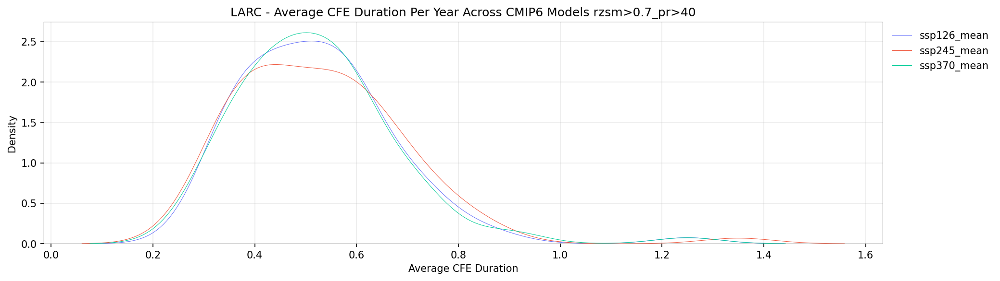

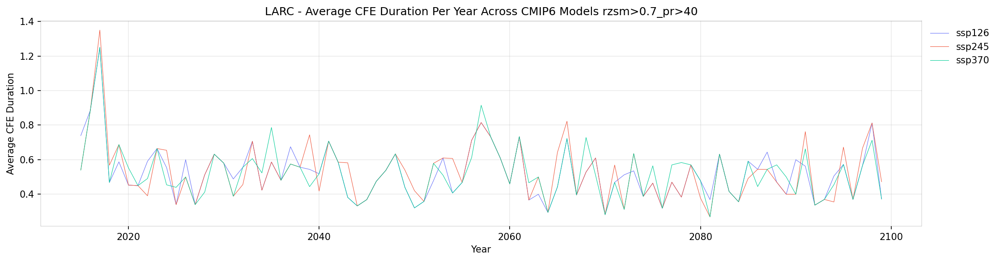

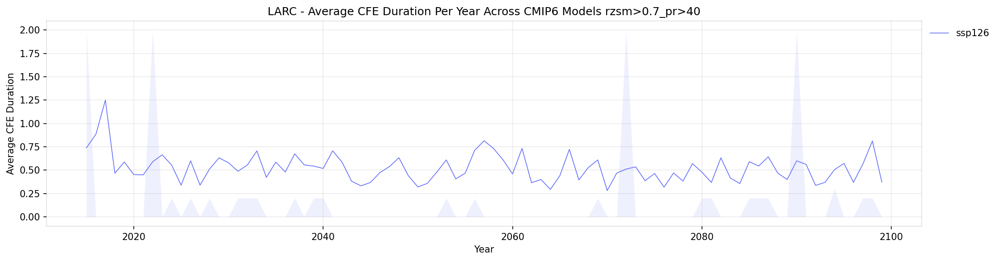

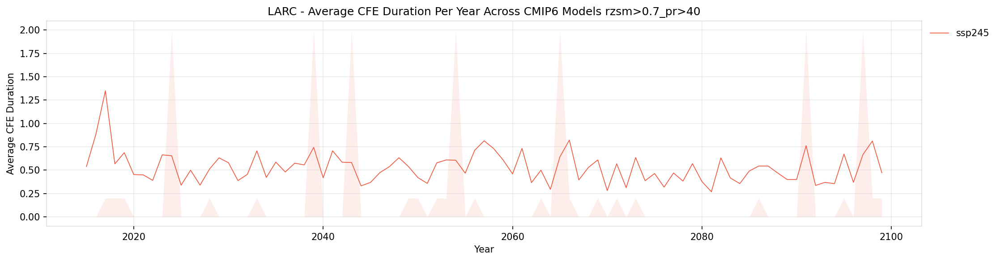

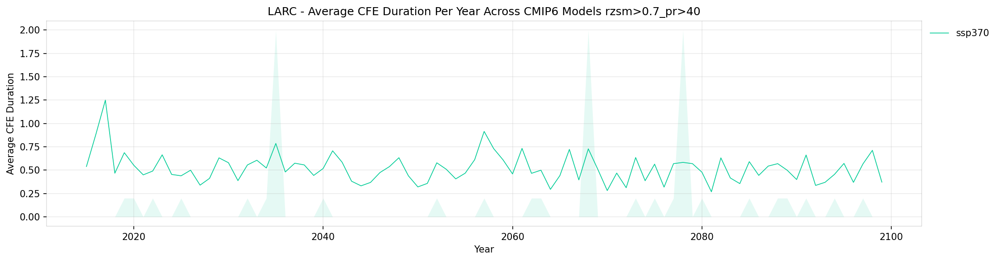

...

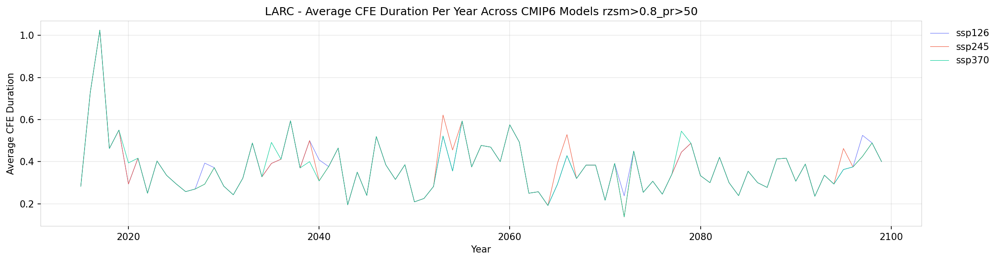

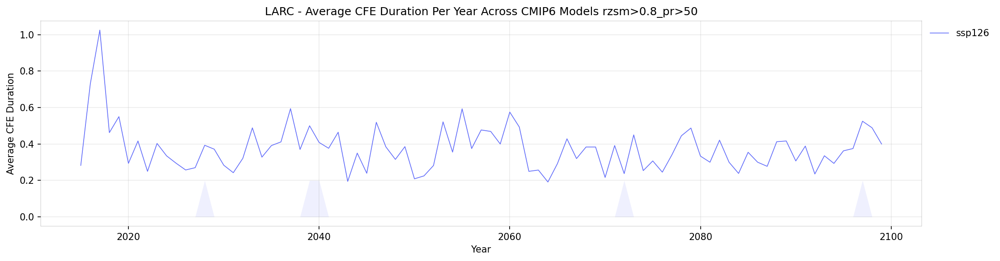

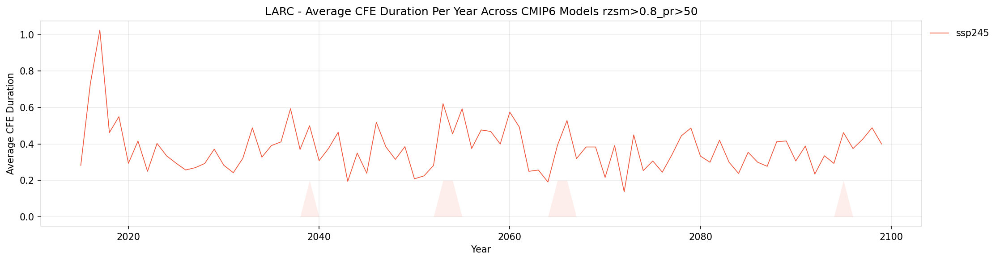

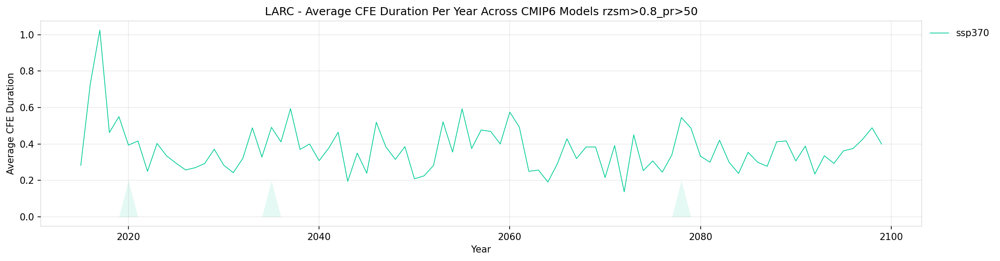

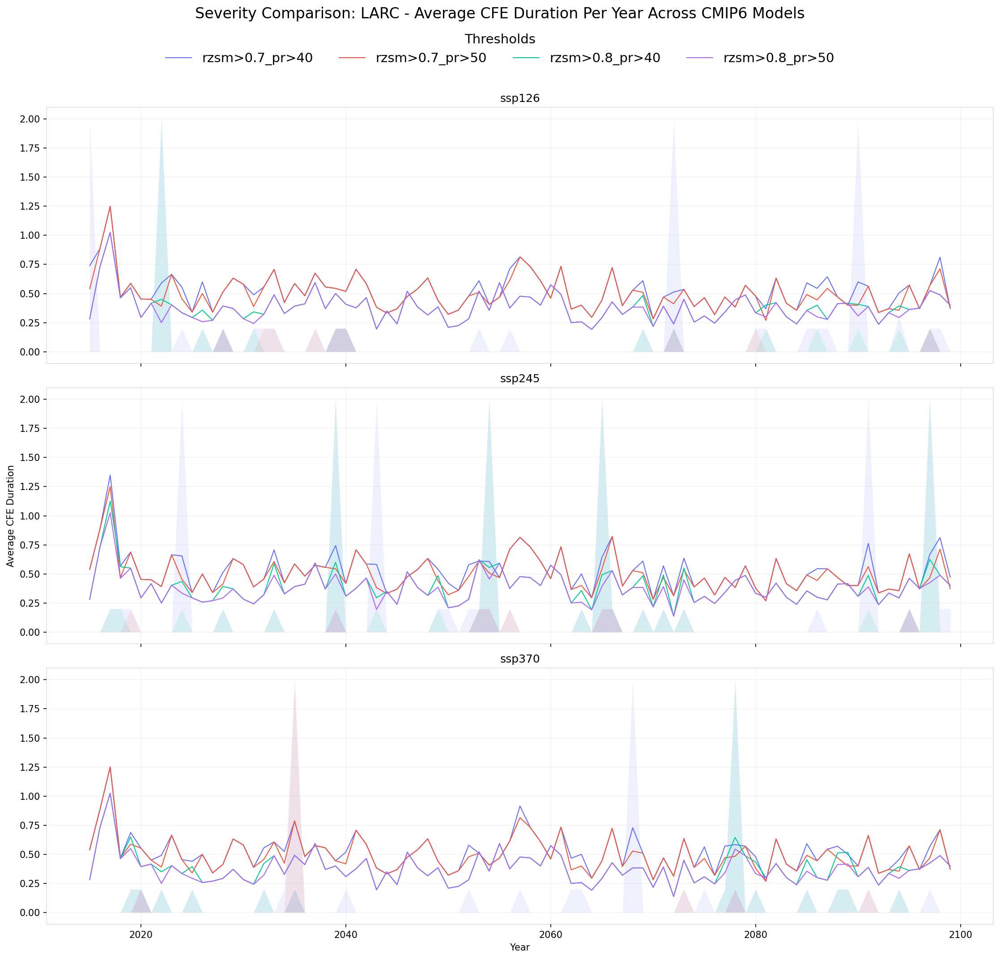

In [4]:
# Average Compound Event Duration
m = '_duration_mean$'
Plot(center, months, metrics[m], m).all(result, plotly)

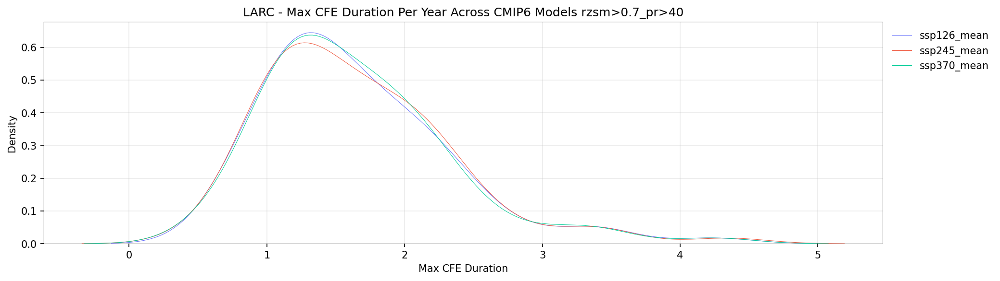

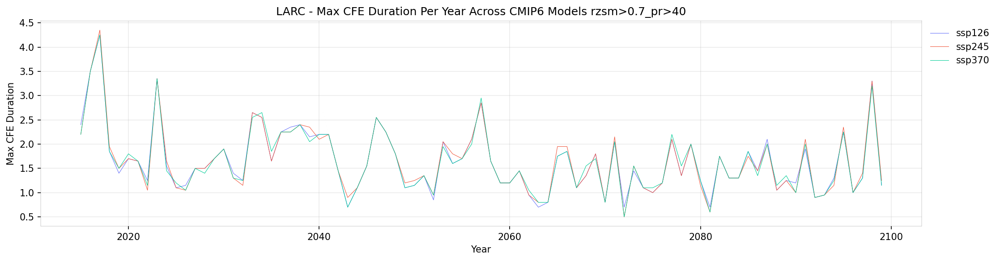

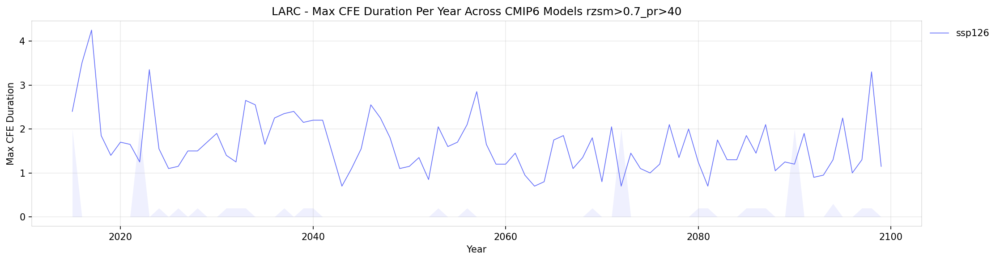

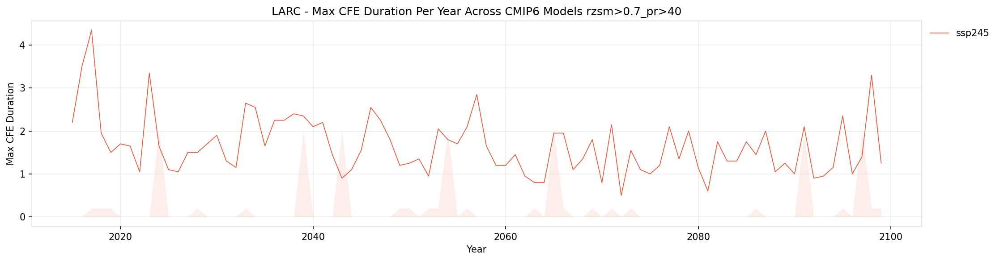

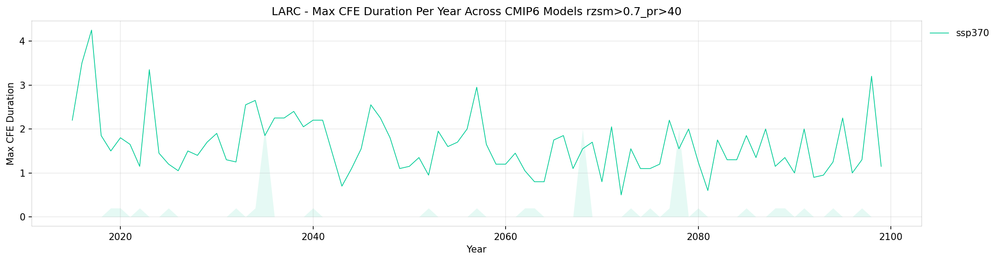

...

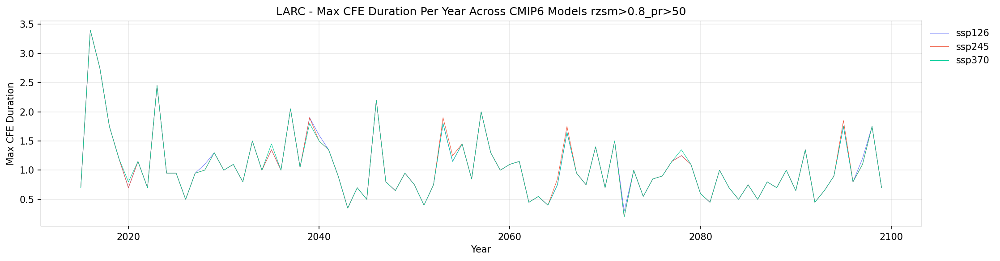

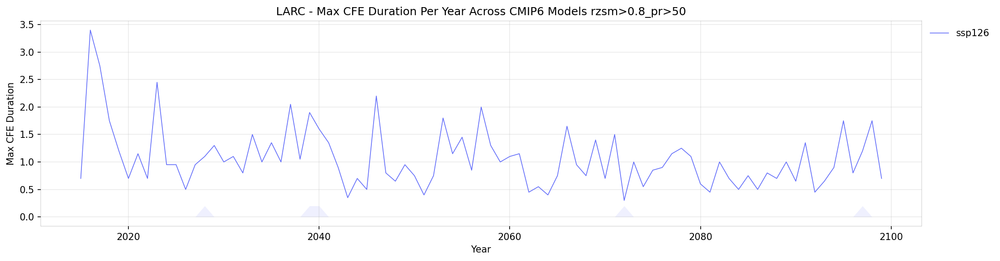

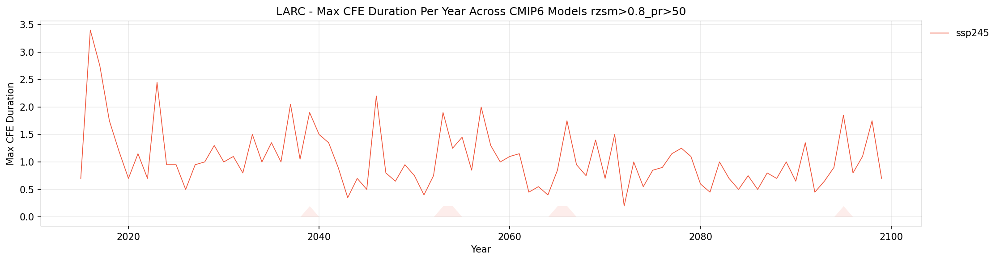

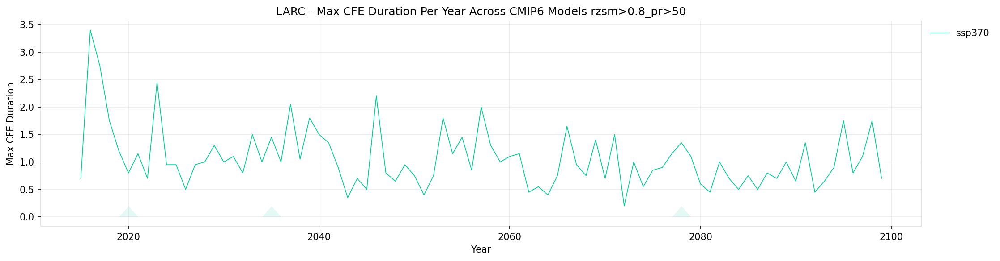

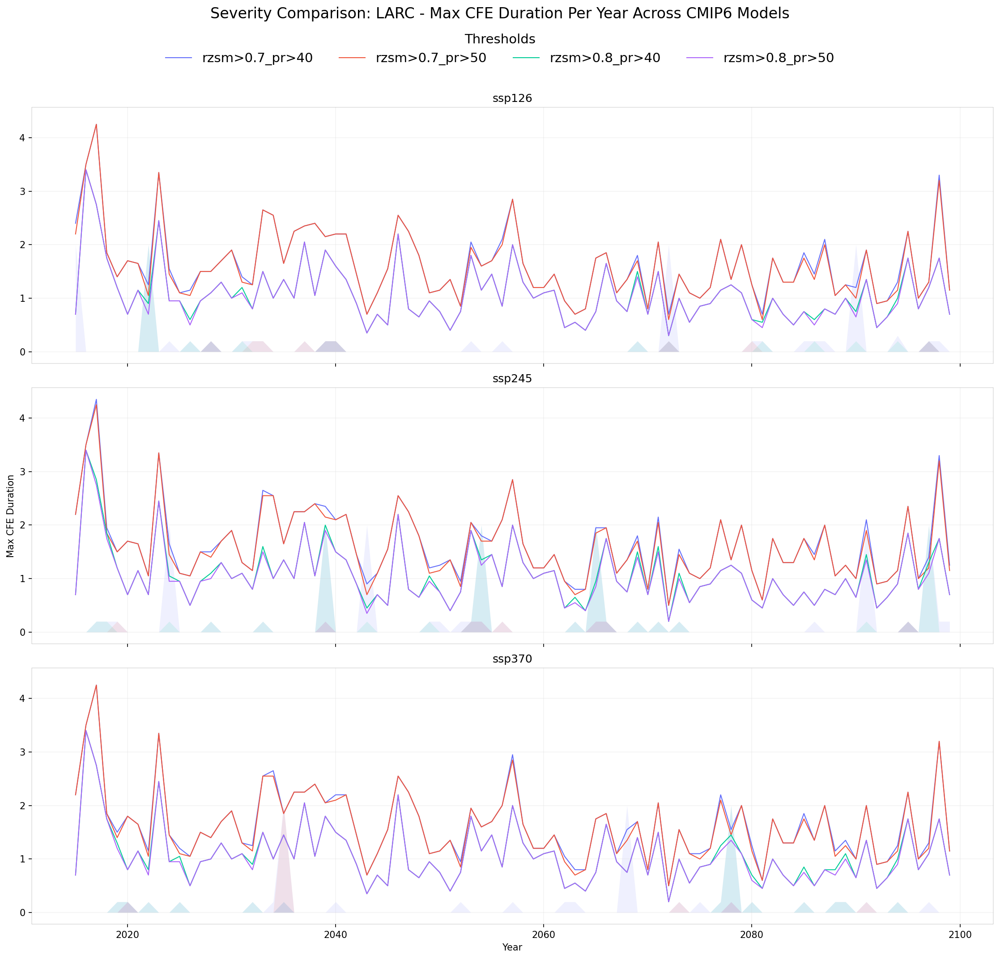

In [5]:
# Max Consecutive Compound Events
m = '_duration_max$'
Plot(center, months, metrics[m], m).all(result, plotly)

## Compound Event Comparison: Total Sequences vs Average Duration vs Max Duration

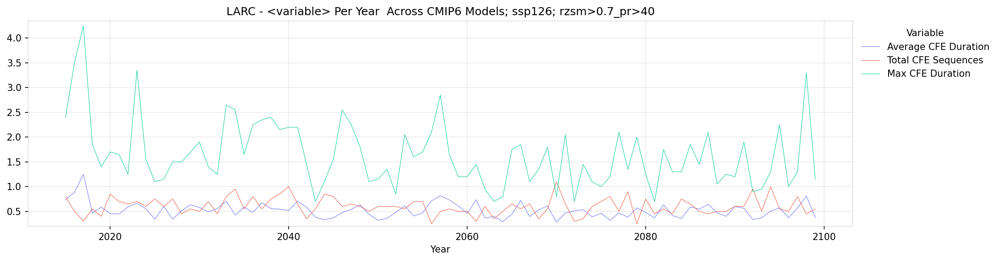

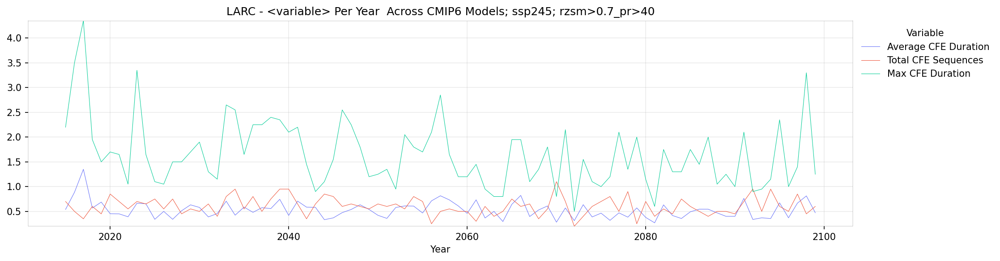

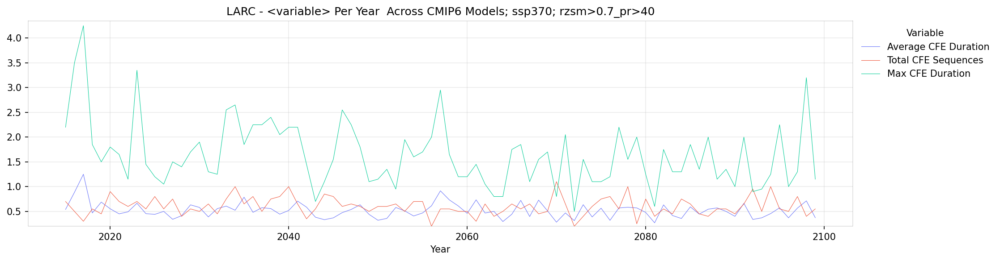

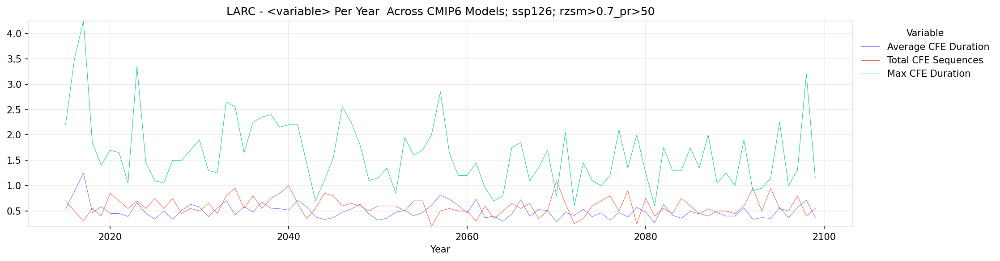

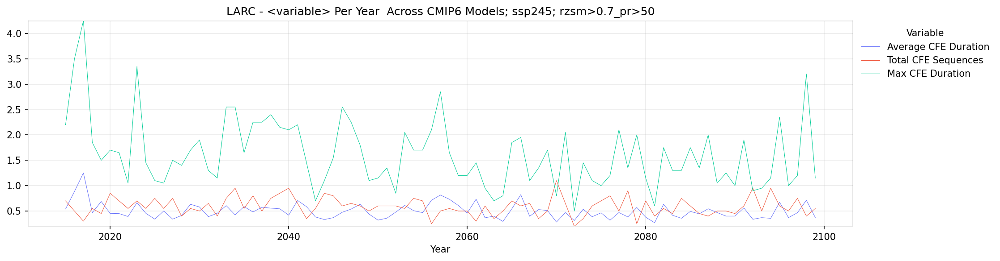

...

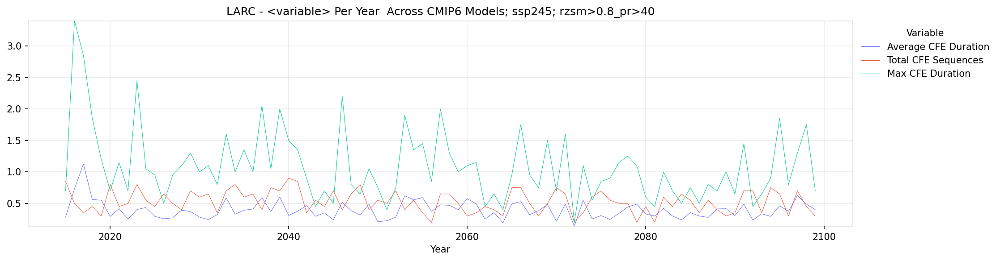

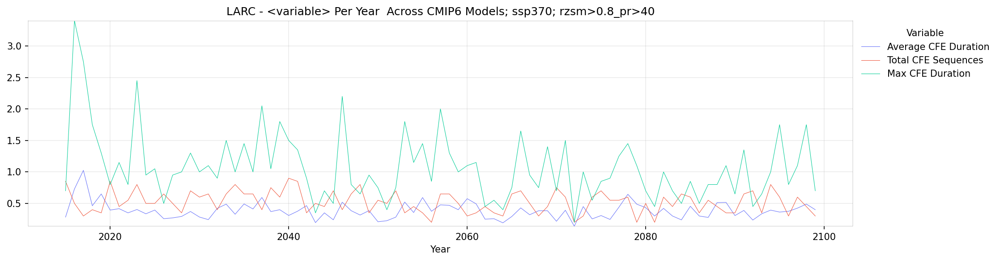

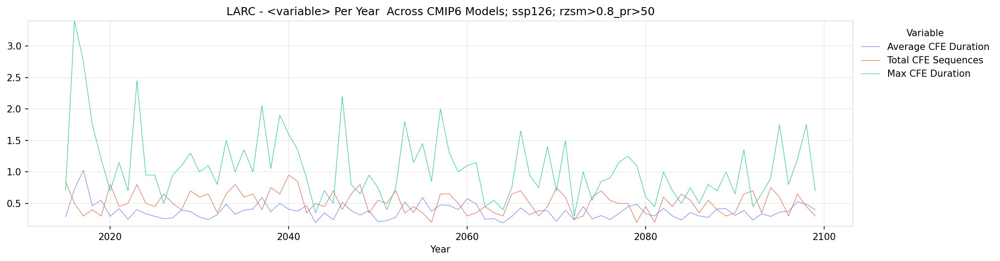

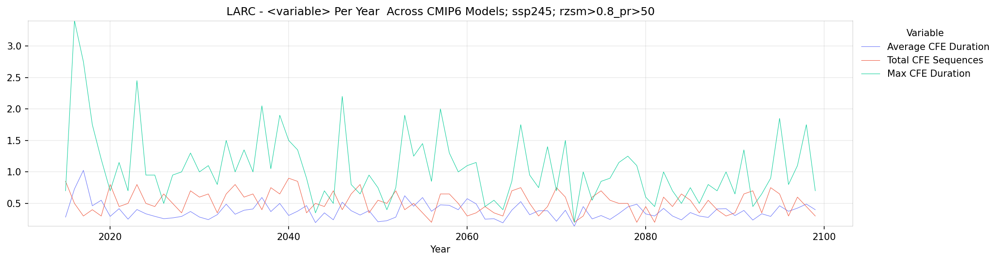

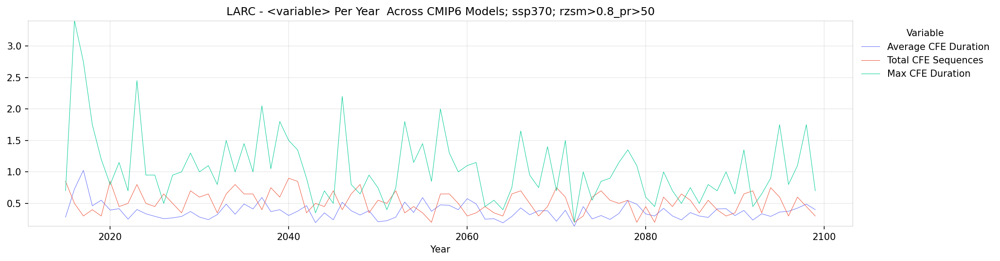

In [6]:
var = ['_duration_mean$', '_sequence_total$', '_duration_max$']            
Plot(center, months, '', '').variable_comp(result, var, metrics)

## SPI Time Scale Comparison

In [ ]:
%%time
%%capture

scales = [7, 14, 30, 60, 90]#[:2] # days

def process_scale(s, threshold):
    result_, compound_, groups_ = Compound(center, event, months, freq, s, threshold, gamma_n).main()
    thres = result_.threshold.unique()[0]
    spi_ = groups_['spi']
    result_.insert(0, 'scale', s)
    compound_.insert(0, 'scale', s)
    spi_.insert(0, 'scale', s)
    return (result_.drop(columns='threshold'), compound_.drop(columns='threshold'), 
            spi_.reset_index(), thres)

if 'spi' in groups:
    results, compounds, spis, threshold = zip(*[process_scale(s, thresholds[:1]) for s in scales])

    results = pd.concat(results, ignore_index=True)
    compounds = pd.concat(compounds, ignore_index=True)
    spis = pd.concat(spis, ignore_index=True)
    threshold = threshold[0]

In [ ]:
if 'spi' in groups:
    Plot(center, months, '', '').scale_comp(results, metrics, threshold)